In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [17]:
merged_df = pd.read_csv("merged_data.csv")

In [3]:
merged_df.head()

,trip_uuid,speed,localtimems
0,a06cb179-f342-4dee-b79f-0ae68dd25033,10.141666,79967103.0
1,a06cb179-f342-4dee-b79f-0ae68dd25033,15.980556,80683172.0
2,a06cb179-f342-4dee-b79f-0ae68dd25033,12.844444,80591963.0
3,a06cb179-f342-4dee-b79f-0ae68dd25033,13.202778,80520856.0
4,a06cb179-f342-4dee-b79f-0ae68dd25033,6.050000,79990905.0


In [4]:
merged_df.shape

(4645405, 3)

In [18]:
merged_df = merged_df.sort_values(by = 'localtimems')

In [19]:
merged_df['delta_speed'] = merged_df.groupby('trip_uuid')['speed'].diff()
merged_df['delta_time'] = merged_df.groupby('trip_uuid')['localtimems'].diff() / 1000  # converting milliseconds to seconds

merged_df['acceleration'] = merged_df['delta_speed'] / merged_df['delta_time']

In [20]:
merged_df

,trip_uuid,speed,localtimems,delta_speed,delta_time,acceleration
902396,aa0acdaf-c411-41d5-bf64-c956cc7be66e,7.747222,87130.0,NaN,NaN,NaN
902390,aa0acdaf-c411-41d5-bf64-c956cc7be66e,7.002778,87630.0,-0.744444,0.500,-1.488889
902414,aa0acdaf-c411-41d5-bf64-c956cc7be66e,6.283333,88130.0,-0.719445,0.500,-1.438889
902391,aa0acdaf-c411-41d5-bf64-c956cc7be66e,5.575000,88630.0,-0.708333,0.500,-1.416666
902424,aa0acdaf-c411-41d5-bf64-c956cc7be66e,4.983334,89130.0,-0.591666,0.500,-1.183333
...,...,...,...,...,...,...
2948308,7ced7e88-8a53-48e4-a1ff-c768197fb881,0.000000,86359968.0,-14.852778,0.500,-29.705555
2948517,7ced7e88-8a53-48e4-a1ff-c768197fb881,8.352778,86360468.0,8.352778,0.500,16.705555
2948679,7ced7e88-8a53-48e4-a1ff-c768197fb881,9.038889,86360968.0,0.686111,0.500,1.372223
2948844,7ced7e88-8a53-48e4-a1ff-c768197fb881,0.000000,86361468.0,-9.038889,0.500,-18.077778


In [8]:
threshold = 15
sudden_acceleration = merged_df[merged_df['acceleration'] > threshold]
sudden_deceleration = merged_df[merged_df['acceleration'] < -threshold]

In [9]:
print("Sudden Acceleration Events:")
print(sudden_acceleration)

print("\nSudden Deceleration Events:")
print(sudden_deceleration)

Sudden Acceleration Events:
                                    trip_uuid      speed  localtimems  \
4360259  996efd7d-f581-4600-a1b5-4b4ab4d6ec32  30.675000     100435.0   
4360308  996efd7d-f581-4600-a1b5-4b4ab4d6ec32  30.625000     101435.0   
4360281  996efd7d-f581-4600-a1b5-4b4ab4d6ec32  32.561108     102624.0   
4360315  996efd7d-f581-4600-a1b5-4b4ab4d6ec32  30.555555     103436.0   
4360270  996efd7d-f581-4600-a1b5-4b4ab4d6ec32  30.449999     103936.0   
...                                       ...        ...          ...   
2948739  7ced7e88-8a53-48e4-a1ff-c768197fb881  31.263887   86355967.0   
2948779  7ced7e88-8a53-48e4-a1ff-c768197fb881  15.552847   86357468.0   
2948730  7ced7e88-8a53-48e4-a1ff-c768197fb881  14.852778   86359468.0   
2948517  7ced7e88-8a53-48e4-a1ff-c768197fb881   8.352778   86360468.0   
2948644  7ced7e88-8a53-48e4-a1ff-c768197fb881  13.672221   86361974.0   

         delta_speed  delta_time  acceleration  
4360259    21.002778       0.011   1909.343455

In [10]:
# Print sudden acceleration events for each unique trip ID
print("Sudden Acceleration Events:")
for trip_id, group in sudden_acceleration.groupby('trip_uuid'):
    print(f"Trip ID {trip_id}: Sudden acceleration events occurred at the following timestamps - {', '.join(map(str, group['localtimems']))}")

# Print sudden deceleration events for each unique trip ID
print("\nSudden Deceleration Events:")
for trip_id, group in sudden_deceleration.groupby('trip_uuid'):
    print(f"Trip ID {trip_id}: Sudden deceleration events occurred at the following timestamps - {', '.join(map(str, group['localtimems']))}")

Sudden Acceleration Events:
Trip ID 004efcf0-a40e-4e94-b96d-322973476dbb: Sudden acceleration events occurred at the following timestamps - 74258072.0, 74258485.0, 74258572.0, 74258985.0, 74259072.0, 74259485.0, 74259572.0, 74259985.0, 74260072.0, 74260485.0, 74260572.0, 74260985.0, 74261072.0, 74261485.0, 74261573.0, 74261985.0, 74262073.0, 74262485.0, 74262573.0, 74262985.0, 74263073.0, 74263485.0, 74263573.0, 74263985.0, 74264073.0, 74264485.0, 74264573.0, 74264985.0, 74265073.0, 74265485.0, 74265573.0, 74265985.0, 74266073.0, 74266485.0, 74266573.0, 74266985.0, 74267073.0, 74267486.0, 74267573.0, 74267986.0, 74268073.0, 74268486.0, 74268573.0, 74268986.0, 74269073.0, 74269486.0, 74269573.0, 74269986.0, 74270073.0, 74270486.0, 74270573.0, 74270986.0, 74271073.0, 74271486.0, 74271574.0, 74271986.0, 74272074.0, 74272486.0, 74272575.0, 74272986.0, 74273174.0, 74273486.0, 74273674.0, 74273986.0, 74274174.0, 74274486.0, 74274676.0, 74274986.0, 74275274.0, 74275486.0, 74275774.0, 74275986

Trip ID 0985d934-ac04-47e6-ad39-80471b2281a6: Sudden acceleration events occurred at the following timestamps - 76033815.0, 76034315.0, 76034815.0, 76035315.0, 76035815.0, 76036315.0, 76036815.0, 76037316.0, 76037816.0, 76038316.0, 76038816.0, 76039316.0, 76039816.0, 76040316.0, 76040816.0, 76041316.0, 76041816.0, 76042316.0, 76042816.0, 76043316.0, 76043816.0, 76044316.0, 76044816.0, 76045316.0, 76045816.0, 76046316.0, 76046816.0, 76047317.0, 76047817.0, 76048317.0, 76048817.0, 76049317.0, 76049817.0, 76050317.0, 76050817.0, 76051317.0, 76051817.0, 76052317.0, 76052817.0, 76053317.0, 76053817.0, 76054317.0, 76054817.0, 76055317.0, 76055817.0, 76056317.0, 76056817.0, 76057318.0, 76057818.0, 76058318.0, 76058818.0, 76059318.0, 76059818.0, 76060318.0, 76060818.0, 76061318.0, 76061818.0, 76062318.0, 76062818.0, 76063318.0, 76063818.0, 76064318.0, 76064818.0, 76065318.0, 76065818.0, 76066318.0, 76066818.0, 76067319.0, 76067819.0, 76068319.0, 76068819.0, 76069319.0, 76069819.0, 76070319.0, 

Trip ID 11c6831a-3dc7-4c8e-b112-e4dd7b149cc1: Sudden acceleration events occurred at the following timestamps - 77027400.0, 77027902.0, 77028500.0, 77029000.0, 77029500.0, 77030013.0, 77030600.0, 77031100.0, 77031600.0, 77032100.0, 77032600.0, 77033100.0, 77033600.0, 77034100.0, 77034600.0, 77035100.0, 77035600.0, 77036100.0, 77036600.0, 77037101.0, 77037602.0, 77039701.0, 77040201.0, 77040701.0, 77041201.0, 77041701.0, 77042201.0, 77042701.0, 77043201.0, 77043701.0, 77044201.0, 77044701.0, 77045201.0, 77045701.0, 77046201.0, 77046701.0, 77047202.0, 77047702.0, 77048202.0, 77048702.0, 77049202.0, 77049702.0, 77050202.0, 77050702.0, 77051202.0, 77051702.0, 77052202.0, 77052702.0, 77053202.0, 77053702.0, 77054202.0, 77054702.0, 77055202.0, 77055702.0, 77056202.0, 77056702.0, 77057203.0, 77057703.0, 77058203.0, 77058703.0, 77059203.0, 77059703.0, 77060203.0, 77060703.0, 77061203.0, 77061703.0, 77062203.0, 77062703.0, 77063203.0, 77063703.0, 77064203.0, 77064703.0, 77065203.0, 77065703.0, 

Trip ID 17bd2125-ca57-4436-9ab0-d0137003b340: Sudden acceleration events occurred at the following timestamps - 79202523.0, 79202702.0, 79203524.0, 79204123.0, 79204623.0, 79205123.0, 79205623.0, 79206123.0, 79206623.0, 79207123.0, 79207623.0, 79208124.0, 79208624.0, 79209124.0, 79209624.0, 79210124.0, 79210624.0, 79211124.0, 79211624.0, 79212124.0, 79212624.0, 79213124.0, 79213624.0, 79214124.0, 79214624.0, 79215124.0, 79215624.0, 79216124.0, 79216624.0, 79217124.0, 79217624.0, 79218125.0, 79218625.0, 79219125.0, 79219625.0, 79220125.0, 79220625.0, 79221125.0, 79221625.0, 79222125.0, 79222625.0, 79223125.0, 79223625.0, 79224125.0, 79224625.0, 79225125.0, 79225625.0, 79226125.0, 79226625.0, 79227125.0, 79227625.0, 79228125.0, 79228625.0, 79229126.0, 79229626.0, 79230126.0, 79230626.0, 79231126.0, 79231626.0, 79232126.0, 79232626.0, 79233126.0, 79233626.0, 79234126.0, 79234626.0, 79235126.0, 79235626.0, 79236126.0, 79236626.0, 79237126.0, 79237626.0, 79238126.0, 79238626.0, 79239127.0, 

Trip ID 210f361f-d0de-444d-8903-affaf3b4d8f6: Sudden acceleration events occurred at the following timestamps - 66506303.0, 66506803.0, 66507304.0, 66507804.0, 66508304.0, 66508804.0, 66511304.0, 66511804.0, 66512304.0, 66512804.0, 66513304.0, 66513804.0, 66514304.0, 66514804.0, 66515304.0, 66515804.0, 66516304.0, 66516804.0, 66517305.0, 66517805.0, 66518306.0, 66518905.0, 66519405.0, 66519905.0, 66520418.0, 66521005.0, 66530506.0, 66531006.0, 66531506.0, 66532006.0, 66532506.0, 66533006.0, 66533506.0, 66534006.0, 66534506.0, 66535006.0, 66535506.0, 66536006.0, 66536506.0, 66537006.0, 66537506.0, 66538006.0, 66538506.0, 66539006.0, 66539507.0, 66540007.0, 66540507.0, 66541007.0, 66541507.0, 66542007.0, 66542507.0, 66543507.0, 66544007.0, 66544507.0, 66545007.0, 66545507.0, 66546007.0, 66546507.0, 66547007.0, 66547507.0, 66548007.0, 66585811.0, 66586311.0, 66586811.0, 66587311.0, 66587811.0, 66588312.0, 66588911.0, 66589411.0, 66589911.0, 66590425.0, 66591011.0, 66591512.0, 66592012.0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Trip ID 94256a08-1aad-4110-b5fb-562ce2c8190c: Sudden acceleration events occurred at the following timestamps - 41134952.0, 41135179.0, 41144179.0, 41144679.0, 41145179.0, 41145679.0, 41146179.0, 41146679.0, 41147180.0, 41147680.0, 41148180.0, 41148680.0, 41149180.0, 41149680.0, 41150180.0, 41150680.0, 41151180.0, 41151680.0, 41152180.0, 41152680.0, 41153180.0, 41153680.0, 41154180.0, 41154680.0, 41155180.0, 41155680.0, 41156180.0, 41156680.0, 41157180.0, 41157680.0, 41158180.0, 41158680.0, 41159180.0, 41159567.0, 41159680.0, 41160067.0, 41160181.0, 41160567.0, 41160681.0, 41161067.0, 41161181.0, 41161567.0, 41161681.0, 41162067.0, 41162181.0, 41162567.0, 41163067.0, 41163567.0, 41164067.0, 41164567.0, 41165067.0, 41165567.0, 41166067.0, 41166568.0, 41167068.0, 41167568.0, 41168068.0, 41168568.0, 41169068.0, 41169568.0, 41170068.0, 41170568.0, 41171068.0, 41171568.0, 41172068.0, 41172568.0, 41173068.0, 41173568.0, 41174068.0, 41174568.0, 41175068.0, 41175568.0, 41176068.0, 41176568.0, 

Trip ID 9db9fd73-1792-4ee5-ac70-79931ff5ffd0: Sudden acceleration events occurred at the following timestamps - 41219925.0, 41220005.0, 41220310.0, 41220425.0, 41220506.0, 41220810.0, 41220925.0, 41221006.0, 41221311.0, 41221506.0, 41221812.0, 41222006.0, 41222411.0, 41222506.0, 41222911.0, 41223006.0, 41223425.0, 41223506.0, 41224006.0, 41224011.0, 41224506.0, 41224511.0, 41225006.0, 41225011.0, 41225506.0, 41225511.0, 41226006.0, 41226011.0, 41226506.0, 41226511.0, 41227006.0, 41227011.0, 41227506.0, 41227511.0, 41228006.0, 41228011.0, 41228506.0, 41228511.0, 41228624.0, 41229006.0, 41229011.0, 41229124.0, 41229506.0, 41229624.0, 41230006.0, 41230011.0, 41230125.0, 41230507.0, 41230511.0, 41230625.0, 41231007.0, 41231011.0, 41231125.0, 41231507.0, 41231511.0, 41231625.0, 41232007.0, 41232011.0, 41232125.0, 41232507.0, 41232512.0, 41232625.0, 41233007.0, 41233012.0, 41233125.0, 41233507.0, 41233512.0, 41233625.0, 41234007.0, 41234012.0, 41234125.0, 41234507.0, 41234512.0, 41234625.0, 

Trip ID a6d98d63-cf2c-4968-bb1b-b53b88616603: Sudden acceleration events occurred at the following timestamps - 60743274.0, 60745369.0, 60745925.0, 60746925.0, 60747425.0, 60747925.0, 60748425.0, 60748925.0, 60749425.0, 60749925.0, 60750425.0, 60750925.0, 60751425.0, 60751925.0, 60752425.0, 60752925.0, 60753425.0, 60753925.0, 60754426.0, 60754926.0, 60755426.0, 60755926.0, 60756426.0, 60756926.0, 60757426.0, 60757926.0, 60758426.0, 60758926.0, 60759426.0, 60759926.0, 60760426.0, 60760926.0, 60761426.0, 60761926.0, 60762426.0, 60762926.0, 60763426.0, 60763926.0, 60764426.0, 60764926.0, 60765427.0, 60765927.0, 60766427.0, 60766927.0, 60767427.0, 60767927.0, 60768427.0, 60768927.0, 60769427.0, 60769927.0, 60770427.0, 60770927.0, 60771427.0, 60771927.0, 60772427.0, 60772927.0, 60773427.0, 60773927.0, 60774427.0, 60774927.0, 60775428.0, 60775928.0, 60776428.0, 60776928.0, 60777428.0, 60777928.0, 60778428.0, 60778928.0, 60779428.0, 60779928.0, 60780928.0, 60781428.0, 60781928.0, 60782428.0, 

Trip ID b0577d04-a974-4727-a3a1-243cb9bc40d0: Sudden acceleration events occurred at the following timestamps - 61515820.0, 61516320.0, 61516820.0, 61517320.0, 61517820.0, 61518320.0, 61518820.0, 61519320.0, 61519820.0, 61520320.0, 61520820.0, 61521320.0, 61521820.0, 61522320.0, 61522820.0, 61523321.0, 61523821.0, 61524321.0, 61529921.0, 61530422.0, 61531021.0, 61531521.0, 61599836.0, 61603425.0, 61603925.0, 61604425.0, 61604925.0, 61605426.0, 61605926.0, 61606426.0, 61606926.0, 61607426.0, 61607926.0, 61608426.0, 61608926.0, 61609426.0, 61609926.0, 61610426.0, 61610926.0, 61611426.0, 61611926.0, 61612426.0, 61612926.0, 61613426.0, 61613926.0, 61614426.0, 61614926.0, 61615427.0, 61615927.0, 61616427.0, 61616927.0, 61617427.0, 61617927.0, 61628230.0, 61628730.0, 61629230.0, 61632731.0, 61633231.0, 61633731.0, 61634231.0, 61634731.0, 61635231.0, 61635731.0, 61636231.0, 61636731.0, 61637231.0, 61637731.0, 61638231.0, 61638731.0, 61639231.0, 61639731.0, 61640231.0, 61640731.0, 61641232.0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Trip ID 004efcf0-a40e-4e94-b96d-322973476dbb: Sudden deceleration events occurred at the following timestamps - 74258023.0, 74258350.0, 74258523.0, 74258850.0, 74259023.0, 74259350.0, 74259523.0, 74259850.0, 74260023.0, 74260350.0, 74260523.0, 74260851.0, 74261023.0, 74261351.0, 74261523.0, 74261851.0, 74262023.0, 74262351.0, 74262523.0, 74262851.0, 74263023.0, 74263352.0, 74263524.0, 74263852.0, 74264024.0, 74264352.0, 74264524.0, 74264852.0, 74265024.0, 74265352.0, 74265524.0, 74265852.0, 74266024.0, 74266352.0, 74266524.0, 74266852.0, 74267024.0, 74267352.0, 74267524.0, 74267951.0, 74268024.0, 74268451.0, 74268524.0, 74268951.0, 74269024.0, 74269451.0, 74269524.0, 74269951.0, 74270024.0, 74270451.0, 74270524.0, 74270951.0, 74271024.0, 74271451.0, 74271524.0, 74271951.0, 74272024.0, 74272452.0, 74272524.0, 74272952.0, 74273024.0, 74273452.0, 74273525.0, 74273952.0, 74274025.0, 74274452.0, 74274525.0, 74274952.0, 74275025.0, 74275452.0, 74275525.0, 74275952.0, 74276026.0, 74276452.0, 

Trip ID 09a29936-f055-46cb-a20c-910bdf29cc00: Sudden deceleration events occurred at the following timestamps - 66985956.0, 66986456.0, 66986956.0, 66987471.0, 66988056.0, 66988556.0, 66989056.0, 66989556.0, 66990056.0, 66990556.0, 66991056.0, 66991556.0, 66992056.0, 66992556.0, 66993056.0, 66993556.0, 66994056.0, 66994557.0, 66995057.0, 66995557.0, 66996057.0, 66996557.0, 66997057.0, 66997557.0, 66998057.0, 66998557.0, 66999057.0, 66999558.0, 67000157.0, 67000657.0, 67001157.0, 67001657.0, 67002157.0, 67002657.0, 67003158.0, 67003757.0, 67004257.0, 67004757.0, 67005258.0, 67005759.0, 67006358.0, 67006858.0, 67007360.0, 67007958.0, 67008458.0, 67008958.0, 67009472.0, 67010058.0, 67010558.0, 67011058.0, 67011558.0, 67012058.0, 67012558.0, 67013058.0, 67013558.0, 67014058.0, 67014558.0, 67015058.0, 67015558.0, 67016058.0, 67016559.0, 67017059.0, 67017559.0, 67018059.0, 67018559.0, 67019059.0, 67019559.0, 67020059.0, 67020559.0, 67021059.0, 67021559.0, 67022059.0, 67022559.0, 67023059.0, 

Trip ID 162e27a0-8c14-4cd8-be30-223cbf4be51b: Sudden deceleration events occurred at the following timestamps - 78211549.0, 78211895.0, 78212049.0, 78212395.0, 78212550.0, 78212895.0, 78213050.0, 78213550.0, 78213895.0, 78214050.0, 78214395.0, 78214396.0, 78214895.0, 78214896.0, 78215395.0, 78215396.0, 78215895.0, 78215896.0, 78216396.0, 78216551.0, 78216896.0, 78216896.0, 78217150.0, 78217396.0, 78217650.0, 78217896.0, 78218150.0, 78218396.0, 78218661.0, 78218896.0, 78219250.0, 78219396.0, 78219750.0, 78219896.0, 78220250.0, 78220398.0, 78220750.0, 78220997.0, 78221251.0, 78221497.0, 78221751.0, 78221997.0, 78222251.0, 78222497.0, 78222751.0, 78222997.0, 78223251.0, 78223497.0, 78223751.0, 78223997.0, 78224251.0, 78224497.0, 78224751.0, 78224997.0, 78225251.0, 78225497.0, 78225751.0, 78225997.0, 78226251.0, 78226497.0, 78226751.0, 78226997.0, 78227251.0, 78227497.0, 78227751.0, 78227997.0, 78228251.0, 78228497.0, 78228751.0, 78228997.0, 78229251.0, 78229497.0, 78229751.0, 78229997.0, 

Trip ID 1dd5284b-92e9-48e7-a786-8d47534ce72f: Sudden deceleration events occurred at the following timestamps - 76132198.0, 76132698.0, 76133198.0, 76133698.0, 76134198.0, 76134698.0, 76135198.0, 76135698.0, 76136198.0, 76136698.0, 76137198.0, 76137698.0, 76138199.0, 76138699.0, 76139199.0, 76139699.0, 76140199.0, 76140699.0, 76141199.0, 76141699.0, 76142199.0, 76142699.0, 76143199.0, 76143699.0, 76144199.0, 76144699.0, 76145199.0, 76145699.0, 76146199.0, 76146699.0, 76147199.0, 76147699.0, 76148199.0, 76148699.0, 76149200.0, 76149700.0, 76150200.0, 76150700.0, 76151200.0, 76151700.0, 76152200.0, 76152700.0, 76153200.0, 76153700.0, 76154200.0, 76154700.0, 76155200.0, 76155700.0, 76156200.0, 76156700.0, 76157200.0, 76157700.0, 76158200.0, 76158700.0, 76159200.0, 76159700.0, 76160201.0, 76160701.0, 76161201.0, 76161701.0, 76162201.0, 76162701.0, 76163201.0, 76163701.0, 76164701.0, 76165201.0, 76165701.0, 76166201.0, 76166701.0, 76167201.0, 76167701.0, 76168201.0, 76168701.0, 76169201.0, 

Trip ID 2761f471-adb1-489f-ad57-5b743a17d7d8: Sudden deceleration events occurred at the following timestamps - 47502249.0, 47502749.0, 47503249.0, 47503749.0, 47504249.0, 47504749.0, 47505249.0, 47505379.0, 47506249.0, 47506749.0, 47507249.0, 47507749.0, 47508249.0, 47508749.0, 47509250.0, 47509750.0, 47510250.0, 47510750.0, 47511250.0, 47511750.0, 47512250.0, 47512750.0, 47513250.0, 47513750.0, 47514250.0, 47514750.0, 47515250.0, 47515750.0, 47516250.0, 47516750.0, 47517380.0, 47517750.0, 47518250.0, 47518750.0, 47519250.0, 47519750.0, 47520250.0, 47520750.0, 47521250.0, 47521750.0, 47522251.0, 47522751.0, 47523251.0, 47523751.0, 47524251.0, 47524751.0, 47525751.0, 47526251.0, 47526751.0, 47527751.0, 47528251.0, 47528751.0, 47529751.0, 47530251.0, 47530751.0, 47531251.0, 47531751.0, 47532252.0, 47532851.0, 47533351.0, 47533852.0, 47534352.0, 47534852.0, 47535352.0, 47535852.0, 47536352.0, 47536852.0, 47537352.0, 47537852.0, 47538352.0, 47538852.0, 47539482.0, 47539852.0, 47540352.0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Trip ID 993c9156-2abe-4470-9acd-400aafd910f9: Sudden deceleration events occurred at the following timestamps - 10171491.0, 10172503.0, 10174091.0, 10392179.0, 10392679.0, 10393179.0, 10393679.0, 10394180.0, 10394680.0, 10395180.0, 10395680.0, 10396180.0, 10396680.0, 10397180.0, 10397680.0, 10398180.0, 10398680.0, 10399180.0, 10399680.0, 10400180.0, 10400680.0, 10401180.0, 10401680.0, 10402180.0, 10402680.0, 10403181.0, 10403681.0, 10404181.0, 10404681.0, 10405181.0, 10405681.0, 10406181.0, 10406681.0, 10407181.0, 10407681.0, 10408181.0, 10408681.0, 10409181.0, 10409681.0, 10410181.0, 10410681.0, 10411181.0, 10411681.0, 10412181.0, 10412681.0, 10413181.0, 10413681.0, 10414182.0, 10414682.0, 10415182.0, 10415682.0, 10416182.0, 10416682.0, 10417182.0, 10417682.0, 10418182.0, 10418682.0, 10419182.0, 10419682.0, 10420182.0, 10420682.0, 10421182.0, 10421682.0, 10422182.0, 10422682.0, 10423182.0, 10423682.0, 10424183.0, 10424683.0, 10425183.0, 10425683.0, 10426183.0, 10426683.0, 10427183.0,

Trip ID a3be886e-5953-4cbf-9b2c-181f6527f5a2: Sudden deceleration events occurred at the following timestamps - 63253477.0, 63253599.0, 63254187.0, 63254687.0, 63255007.0, 63255687.0, 63256187.0, 63256507.0, 63257007.0, 63257507.0, 63258007.0, 63258507.0, 63259007.0, 63259507.0, 63260007.0, 63260507.0, 63261007.0, 63261507.0, 63262007.0, 63262507.0, 63263007.0, 63263507.0, 63263688.0, 63264007.0, 63264188.0, 63264508.0, 63264688.0, 63265008.0, 63265188.0, 63265508.0, 63265688.0, 63266008.0, 63266188.0, 63266508.0, 63266688.0, 63267008.0, 63267188.0, 63267508.0, 63267688.0, 63268008.0, 63268188.0, 63268508.0, 63268688.0, 63269008.0, 63269188.0, 63269508.0, 63269688.0, 63270008.0, 63270188.0, 63270508.0, 63270688.0, 63271008.0, 63271188.0, 63271508.0, 63272008.0, 63272508.0, 63273008.0, 63273508.0, 63274008.0, 63274509.0, 63275009.0, 63275509.0, 63275689.0, 63276009.0, 63276189.0, 63276509.0, 63276689.0, 63277009.0, 63277189.0, 63277509.0, 63277689.0, 63278009.0, 63278189.0, 63278509.0, 

Trip ID aa401da5-b275-4333-8186-72adb4f14fda: Sudden deceleration events occurred at the following timestamps - 72072735.0, 72073235.0, 72073735.0, 72074235.0, 72074735.0, 72075235.0, 72075735.0, 72076235.0, 72076735.0, 72077236.0, 72077736.0, 72078236.0, 72078736.0, 72079236.0, 72079736.0, 72080236.0, 72080736.0, 72081236.0, 72081736.0, 72082236.0, 72082736.0, 72083236.0, 72083736.0, 72084236.0, 72084736.0, 72085236.0, 72085736.0, 72086237.0, 72086737.0, 72087237.0, 72087737.0, 72088237.0, 72088737.0, 72089237.0, 72089737.0, 72090237.0, 72090737.0, 72091237.0, 72091737.0, 72092237.0, 72092737.0, 72093237.0, 72093737.0, 72094237.0, 72094737.0, 72095237.0, 72095737.0, 72096238.0, 72096738.0, 72097238.0, 72097738.0, 72098238.0, 72098738.0, 72099238.0, 72099738.0, 72100238.0, 72100738.0, 72101238.0, 72101738.0, 72102238.0, 72102738.0, 72103238.0, 72103738.0, 72104238.0, 72104566.0, 72104738.0, 72105066.0, 72105239.0, 72105566.0, 72105739.0, 72106067.0, 72106239.0, 72106666.0, 72106739.0, 

Trip ID b63383ea-b269-472a-a2da-6a04f0fe9ec1: Sudden deceleration events occurred at the following timestamps - 35511904.0, 35512404.0, 35512904.0, 35513904.0, 35514404.0, 35514904.0, 35515404.0, 35515904.0, 35516404.0, 35516904.0, 35517404.0, 35517904.0, 35518404.0, 35518904.0, 35519404.0, 35519904.0, 35520404.0, 35520904.0, 35521404.0, 35521904.0, 35522404.0, 35523105.0, 35523605.0, 35672201.0, 35672701.0, 35673201.0, 35674701.0, 35675201.0, 35675701.0, 35676201.0, 35676701.0, 35677201.0, 35677701.0, 35678201.0, 35678701.0, 35679201.0, 35679701.0, 35680201.0, 35680701.0, 35681201.0, 35681701.0, 35682201.0, 35682701.0, 35683201.0, 35683701.0, 35684201.0, 35684701.0, 35685201.0, 35685701.0, 35686201.0, 35686701.0, 35687201.0, 35687701.0, 35688201.0, 35688701.0, 35689201.0, 35689701.0, 35690201.0, 35690701.0, 35691201.0, 35691701.0, 35692201.0, 35692701.0, 35693201.0, 35693701.0, 35694201.0, 35694701.0, 35695201.0, 35695701.0, 35696201.0, 35696701.0, 35697201.0, 35697701.0, 35698201.0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [11]:
merged_df.columns

Index(['trip_uuid', 'speed', 'localtimems', 'delta_speed', 'delta_time',
       'acceleration'],
      dtype='object')

C:\Users\SriMedha\anaconda3\lib\site-packages\numpy\core\function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
C:\Users\SriMedha\anaconda3\lib\site-packages\numpy\core\function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start


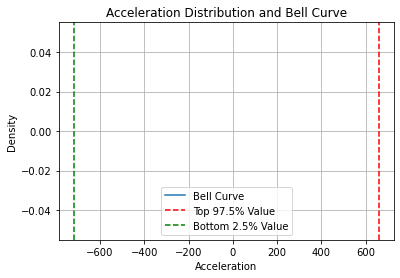

Top 97.5% Value: 657.6390000000001
Bottom 2.5% Value: -716.6666799999998


In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

merged_df = merged_df.dropna(subset=['acceleration'])

# Calculate the top 97.5% value and lowest 2.5% value of the acceleration column
top_percentile = np.percentile(merged_df['acceleration'], 97.5)
bottom_percentile = np.percentile(merged_df['acceleration'], 2.5)

# Plot the bell curve graph
mean = merged_df['acceleration'].mean()
std_dev = merged_df['acceleration'].std()

x = np.linspace(merged_df['acceleration'].min(), merged_df['acceleration'].max(), 1000)
y = norm.pdf(x, mean, std_dev)

plt.plot(x, y, label='Bell Curve')
plt.axvline(x=top_percentile, color='r', linestyle='--', label='Top 97.5% Value')
plt.axvline(x=bottom_percentile, color='g', linestyle='--', label='Bottom 2.5% Value')

plt.xlabel('Acceleration')
plt.ylabel('Density')
plt.title('Acceleration Distribution and Bell Curve')
plt.legend()
plt.grid()
plt.show()

print(f"Top 97.5% Value: {top_percentile}")
print(f"Bottom 2.5% Value: {bottom_percentile}")

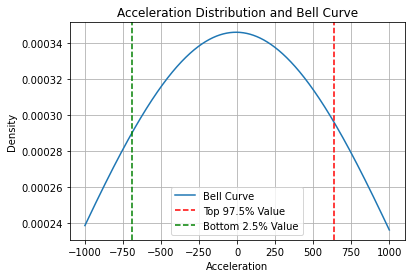

Top 97.5% Value: 639.478442682071
Bottom 2.5% Value: -693.6507876190476


In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Assuming merged_df is your DataFrame containing the 'acceleration' column

# Drop rows with NaN and infinite values in the 'acceleration' column
merged_df = merged_df.dropna(subset=['acceleration'])
merged_df = merged_df[~merged_df['acceleration'].isin([np.inf, -np.inf])]

# Calculate the top 97.5% value and lowest 2.5% value of the acceleration column
top_percentile = np.percentile(merged_df['acceleration'], 97.5)
bottom_percentile = np.percentile(merged_df['acceleration'], 2.5)

# Plot the bell curve graph
mean = merged_df['acceleration'].mean()
std_dev = merged_df['acceleration'].std()

# x = np.linspace(merged_df['acceleration'].min(), merged_df['acceleration'].max(), 1000)
x = np.linspace(-1000, 1000, 1000)
y = norm.pdf(x, mean, std_dev)

plt.plot(x, y, label='Bell Curve')
plt.axvline(x=top_percentile, color='r', linestyle='--', label='Top 97.5% Value')
plt.axvline(x=bottom_percentile, color='g', linestyle='--', label='Bottom 2.5% Value')

plt.xlabel('Acceleration')
plt.ylabel('Density')
plt.title('Acceleration Distribution and Bell Curve')
plt.legend()
plt.grid()
plt.show()

print(f"Top 97.5% Value: {top_percentile}")
print(f"Bottom 2.5% Value: {bottom_percentile}")

In [25]:
merged_df.isnull().sum()

trip_uuid       0
speed           0
localtimems     0
delta_speed     0
delta_time      0
acceleration    0
dtype: int64

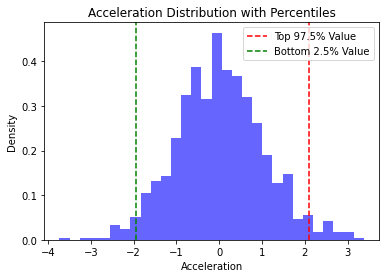

Top 97.5% Value: 2.0935292581489717
Bottom 2.5% Value: -1.9523825976411133


In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Create a sample DataFrame (replace this with your actual DataFrame)
data = {'acceleration': np.random.normal(loc=0, scale=1, size=1000)}  # Example data
dff = pd.DataFrame(data)

# Remove rows with missing values in the acceleration column
dff = dff.dropna(subset=['acceleration'], axis=0, how='any', inplace=False)

# Check if the DataFrame is not empty and acceleration column has finite values
if not dff.empty and np.all(np.isfinite(dff['acceleration'])):
    # Calculate the top 97.5% value and lowest 2.5% value of the acceleration column
    top_percentile = np.percentile(dff['acceleration'], 97.5)
    bottom_percentile = np.percentile(dff['acceleration'], 2.5)

    # Plot the histogram of acceleration distribution
    plt.hist(dff['acceleration'], bins=30, density=True, alpha=0.6, color='b')

    # Plot vertical lines for the percentiles
    plt.axvline(x=top_percentile, color='r', linestyle='--', label='Top 97.5% Value')
    plt.axvline(x=bottom_percentile, color='g', linestyle='--', label='Bottom 2.5% Value')

    # Add labels and title
    plt.xlabel('Acceleration')
    plt.ylabel('Density')
    plt.title('Acceleration Distribution with Percentiles')
    plt.legend()

    # Show the plot
    plt.show()

    print(f"Top 97.5% Value: {top_percentile}")
    print(f"Bottom 2.5% Value: {bottom_percentile}")
else:
    print("Data is empty or contains non-finite values in the 'acceleration' column.")


In [13]:
threshold = 15  
trip_id_to_check = "004efcf0-a40e-4e94-b96d-322973476dbb"  

filtered_acceleration = sudden_acceleration[(sudden_acceleration['trip_uuid'] == trip_id_to_check) & 
                                            (sudden_acceleration['acceleration'] > threshold)]

print(f"Sudden acceleration events above threshold for Trip ID {trip_id_to_check}:")
filtered_acceleration

Sudden acceleration events above threshold for Trip ID 004efcf0-a40e-4e94-b96d-322973476dbb:


,trip_uuid,speed,localtimems,delta_speed,delta_time,acceleration
4478115,004efcf0-a40e-4e94-b96d-322973476dbb,15.447223,74258072.0,1.461112,0.049,29.818612
4479537,004efcf0-a40e-4e94-b96d-322973476dbb,29.291666,74258485.0,26.377777,0.135,195.390941
4484673,004efcf0-a40e-4e94-b96d-322973476dbb,15.950000,74258572.0,2.166667,0.049,44.217694
4482442,004efcf0-a40e-4e94-b96d-322973476dbb,29.380554,74258985.0,25.827776,0.135,191.316861
4478724,004efcf0-a40e-4e94-b96d-322973476dbb,16.436111,74259072.0,3.127778,0.049,63.832204
...,...,...,...,...,...,...
4477379,004efcf0-a40e-4e94-b96d-322973476dbb,30.763890,75672104.0,30.763890,0.075,410.185200
4484593,004efcf0-a40e-4e94-b96d-322973476dbb,30.675000,75672604.0,30.675000,0.075,409.000000
4487088,004efcf0-a40e-4e94-b96d-322973476dbb,30.730555,75673104.0,30.730555,0.075,409.740733
4482965,004efcf0-a40e-4e94-b96d-322973476dbb,30.702778,75673604.0,30.702778,0.075,409.370373


In [14]:
threshold = -15  
trip_id_to_check = "004efcf0-a40e-4e94-b96d-322973476dbb"  

filtered_deceleration = sudden_deceleration[(sudden_deceleration['trip_uuid'] == trip_id_to_check) & 
                                            (sudden_deceleration['acceleration'] < threshold)]

print(f"Sudden deceleration events above threshold for Trip ID {trip_id_to_check}:")
filtered_deceleration

Sudden deceleration events above threshold for Trip ID 004efcf0-a40e-4e94-b96d-322973476dbb:


,trip_uuid,speed,localtimems,delta_speed,delta_time,acceleration
4488961,004efcf0-a40e-4e94-b96d-322973476dbb,13.986111,74258023.0,-15.161112,0.038,-398.976632
4479465,004efcf0-a40e-4e94-b96d-322973476dbb,2.913889,74258350.0,-12.533334,0.278,-45.083935
4477926,004efcf0-a40e-4e94-b96d-322973476dbb,13.783333,74258523.0,-15.508333,0.038,-408.114026
4482976,004efcf0-a40e-4e94-b96d-322973476dbb,3.552778,74258850.0,-12.397222,0.278,-44.594324
4477725,004efcf0-a40e-4e94-b96d-322973476dbb,13.308333,74259023.0,-16.072221,0.038,-422.953184
...,...,...,...,...,...,...
4485673,004efcf0-a40e-4e94-b96d-322973476dbb,0.000000,75672529.0,-30.000000,0.123,-243.902439
4480094,004efcf0-a40e-4e94-b96d-322973476dbb,0.000000,75673029.0,-30.066666,0.123,-244.444439
4488833,004efcf0-a40e-4e94-b96d-322973476dbb,0.000000,75673529.0,-30.113888,0.123,-244.828358
4488009,004efcf0-a40e-4e94-b96d-322973476dbb,0.000000,75674029.0,-30.091665,0.123,-244.647683


In [ ]:
df_summary = pd.read_csv('summary_jan-22.csv')
#Host dataset
df_host = pd.read_csv('host_jan-22.csv')

In [ ]:
df = pd.merge(df_summary[['tripId','device','startlocaltime',
                         'endlocaltime','startlatitude','startlongitude',
                         'endlatitude','endlongitude','numBSMTx', 'numGNSSOutages', 'numCANOutages',
                         'numNormalBSMRx', 'numShadowBSMRx',
                         'numSPATRx', 'numWarnings', 'numInforms', ]], 
              df_host[['tripId','speed','speedMph','filedate','filetimeutc',
                      'localTimeMs','latitude','longitude','gpsspeed','elevation',
                      'brakestatus','turnsignal','yawrate','longaccel']], on = 'tripId')

In [ ]:
df = df.sort_values(by = ['tripId','filedate','localTimeMs'])
df.head()

In [ ]:
selected_columns = ['tripId', 'speedMph', 'localTimeMs']
df_new = df[selected_columns]

In [ ]:
df_new = df_new.sort_values(by = 'localTimeMs')

In [ ]:
df_new['speedMph'].isna().mean()*100

In [ ]:
df_new.head()

In [ ]:
# Convert speed from mph to m/s
df_new['speedMps_mS'] = df_new['speedMph'] * 0.44704  # 1 mph = 0.44704 m/s

# Convert time from ms to s
df_new['localTimeS'] = df_new['localTimeMs'] / 1000  # 1 s = 1000 ms

df_new['delta_speed'] = df_new.groupby('tripId')['speedMph'].diff()
df_new['delta_time'] = df_new.groupby('tripId')['localTimeMs'].diff() / 1000  # converting milliseconds to secon

df_new['acceleration'] = df_new['delta_speed'] / merged_df['delta_time']